In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium as f

#한국어 설정
import matplotlib.font_manager as fm
font_name = fm.FontProperties(fname = 'C:/Windows/Fonts/malgun.ttf').get_name()
plt.rc('font', family = font_name)
plt.rcParams['axes.unicode_minus'] = False

In [29]:
#데이터 불러오기
data1 = pd.read_csv("5대+범죄+발생현황_20231122091636.csv")
data2 = pd.read_csv("서울시 자치구 연도별 방범용 CCTV 운영 현황_230630기준.csv",encoding="cp949",thousands=',')
data3 = pd.read_csv("서울시 강남구 안심이 CCTV 연계 현황.csv",encoding="cp949")
data4 = pd.read_csv("주민등록인구(월별)_20231123143545.csv")

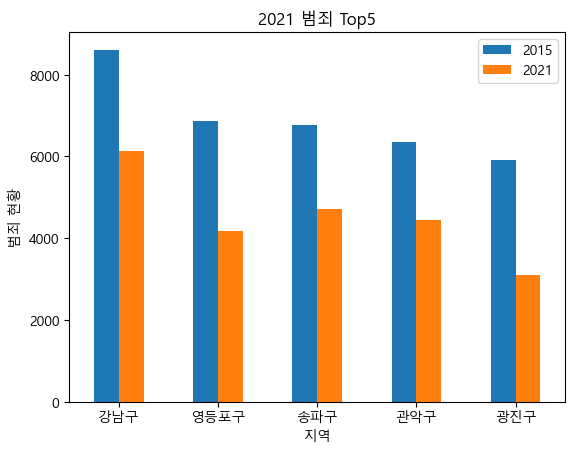

In [30]:
#데이터 정제하기
data1 = data1.drop(['자치구별(1)'], axis = 1)
data_area = data1['자치구별(2)'].drop([0,1,2], axis = 0)
data_area = data_area.reset_index(drop = True)


#15년~21년 범죄 데이터 합계만 뽑음
data15 = data1['2015']
data16 = data1['2016']
data17 = data1['2017']
data18 = data1['2018']
data19 = data1['2019']
data20 = data1['2020']
data21 = data1['2021']
data22 = data1['2022']

#데이터 열과 행이 복잡하게 되어있어서 이렇게 각각 하나씩 나눠서 concat 진행
max_criminal = pd.concat([data15,data16,data17,data18,data19,data20,data21,data22], axis = 1)
max_criminal = max_criminal.drop([0,1,2], axis = 0)
max_criminal = max_criminal.reset_index(drop = True)
max_criminal = max_criminal.astype(float)

#index 값에 자치구 이름을 넣기 위해 concat 하고 index 다시 세팅
max_criminal = pd.concat([data_area, max_criminal], axis = 1)
max_criminal.set_index("자치구별(2)", inplace=True)

#범죄 최다년도 최소년도 구하기
max_criminal_value = max_criminal.iloc[0,:].idxmax() #2015년에 범죄 최다
min_criminal_value = max_criminal.iloc[0,:].idxmin() #2021년에 범죄 최소

#2015년도와 2021년도의 Top5 지역별 데이터를 시각화해서 비교
#강남구 영등포구 송파구 관악구 광진구
data_compare = pd.concat([data15, data21], axis = 1)
data_compare.drop([0,1,2,3], axis = 0,inplace=True)
data_area = data1['자치구별(2)'].drop([0,1,2,3], axis = 0)
data_area = data_area.reset_index(drop = True)
data_compare.set_index(data_area, inplace=True)
data_compare = data_compare.astype(float)
data_compare.sort_values(by='2015' ,ascending=False, inplace=True)
data_compare_top5 = data_compare.iloc[0:5,:]


#데이터 시각화 2021년에 확실하게 범죄가 감소
data_compare_top5.plot.bar(rot=0)
plt.ylabel('범죄 현황')
plt.xlabel('지역')
plt.title('2021 범죄 Top5')
plt.show()

C:\Users\ppjj2\AppData\Local\Temp\ipykernel_35388\425351371.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cctv_compare_top5 = cctv_compare_top5.append(cctv_compare.loc[cctv_compare['지역'] == '영등포구'])
C:\Users\ppjj2\AppData\Local\Temp\ipykernel_35388\425351371.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cctv_compare_top5 = cctv_compare_top5.append(cctv_compare.loc[cctv_compare['지역'] == '송파구'])
C:\Users\ppjj2\AppData\Local\Temp\ipykernel_35388\425351371.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cctv_compare_top5 = cctv_compare_top5.append(cctv_compare.loc[cctv_compare['지역'] == '관악구'])
C:\Users\ppjj2\AppData\Local\Temp\ipykernel_35388\425351371.py:16: FutureWarning: The frame.append method is deprecat

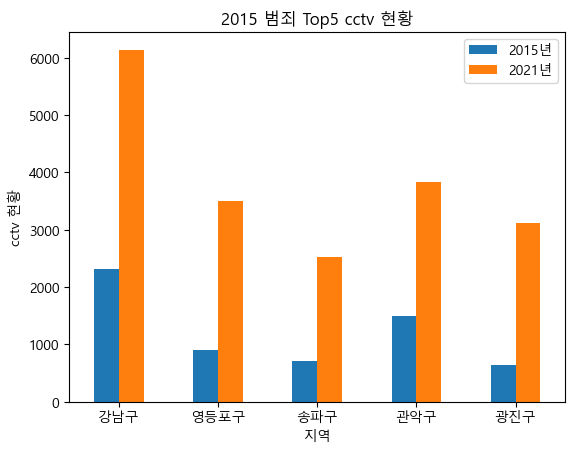

In [16]:
#cctv data 마찬가지로 2015년도와 2021년도 data만 추출
cctv15 = data2['2015년']
cctv21 = data2['2021년']

#cctv data Top5 시각화
cctv_compare = pd.concat([cctv15,cctv21], axis = 1)
cctv_compare.dropna(inplace = True)
cctv_compare = cctv_compare.astype(float)
cctv_compare.insert(0, '지역', data_area)

#cctv data Top5 새로운 프레임 만들기
cctv_compare_top5 = cctv_compare.loc[cctv_compare['지역'] == '강남구']
cctv_compare_top5 = cctv_compare_top5.append(cctv_compare.loc[cctv_compare['지역'] == '영등포구'])
cctv_compare_top5 = cctv_compare_top5.append(cctv_compare.loc[cctv_compare['지역'] == '송파구'])
cctv_compare_top5 = cctv_compare_top5.append(cctv_compare.loc[cctv_compare['지역'] == '관악구'])
cctv_compare_top5 = cctv_compare_top5.append(cctv_compare.loc[cctv_compare['지역'] == '광진구'])
cctv_compare_top5.set_index('지역', inplace=True)

#시각화
cctv_compare_top5.plot.bar(rot=0)
plt.ylabel('cctv 현황')
plt.title('2015 범죄 Top5 cctv 현황')
plt.show()

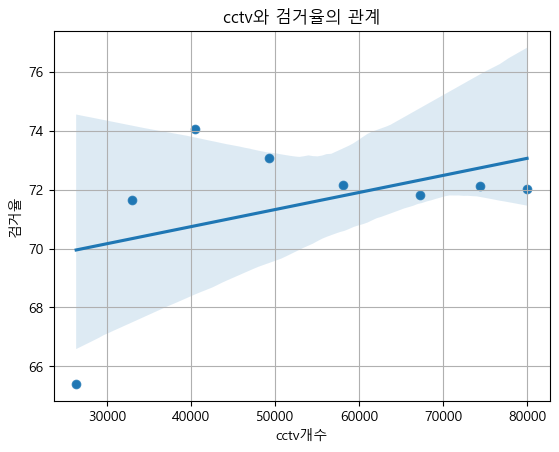

In [22]:
#추세선으로 비교
#15년~21년 범죄, 검거 합계 데이터만 뽑아서 검거율 계산
#cctv 증가에 따른 검거율 추세 확인
data15 = data1[['2015','2015.1']]
data15 = data15.iloc[3,:].astype(float)
data15 = data15.iloc[1]/data15.iloc[0]
data15 = data15*100

data16 = data1[['2016','2016.1']]
data16 = data16.iloc[3,:].astype(float)
data16 = data16.iloc[1]/data16.iloc[0]
data16 = data16*100

data17 = data1[['2017','2017.1']]
data17 = data17.iloc[3,:].astype(float)
data17 = data17.iloc[1]/data17.iloc[0]
data17 = data17*100

data18 = data1[['2018','2018.1']]
data18 = data18.iloc[3,:].astype(float)
data18 = data18.iloc[1]/data18.iloc[0]
data18 = data18*100

data19 = data1[['2019','2019.1']]
data19 = data19.iloc[3,:].astype(float)
data19 = data19.iloc[1]/data19.iloc[0]
data19 = data19*100

data20 = data1[['2020','2020.1']]
data20 = data20.iloc[3,:].astype(float)
data20 = data20.iloc[1]/data20.iloc[0]
data20 = data20*100

data21 = data1[['2021','2021.1']]
data21 = data21.iloc[3,:].astype(float)
data21 = data21.iloc[1]/data21.iloc[0]
data21 = data21*100

data22 = data1[['2022','2022.1']]
data22 = data22.iloc[3,:].astype(float)
data22 = data22.iloc[1]/data22.iloc[0]
data22 = data22*100

#위 값으로 데이터 프레임 새로 만들기
data = {'Category': ['2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022'],
        'Values': [data15, data16, data17, data18, data19, data20, data21, data22]}
arrest_rate = pd.DataFrame(data)
arrest_rate.drop(['Category'], axis = 1, inplace=True)

cctv_sum = data2.iloc[:,2:10].sum()
cctv_sum = cctv_sum.reset_index(drop = True)

arrest_combined_cctv = pd.concat([arrest_rate, pd.DataFrame(cctv_sum)], axis=1, ignore_index=False)

#추세선 시각화
sns.scatterplot(x=arrest_combined_cctv[0], y=arrest_combined_cctv['Values'])
sns.regplot(x=arrest_combined_cctv[0], y=arrest_combined_cctv['Values'])
plt.title('cctv와 검거율의 관계')
plt.xlabel("cctv개수")
plt.ylabel("검거율")
plt.grid()
plt.show() #추세선으로 보아 cctv의 개수가 증가하면 검거율이 증가하는 것을 알 수 있다.

In [7]:
# # 가장 범죄가 많은 곳의 cctv 지도에 시각화(2022년 기준)
# import requests
# import json

# # JSON 파일을 읽어서 변수에 저장, 강남구만 표시
# with open("C:\python_practice\seoul_municipalities_geo.json", "r", encoding="utf-8") as json_file:
#     geo_json_data = json.load(json_file)

# # geo_json_data = requests.get(
# #     "https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo.json"
# # ).json() 서울시 전체 좌표 데이터

# m = f.Map(location=[37.51733823242848, 127.04737854352916], zoom_start=15)
# f.GeoJson(geo_json_data).add_to(m)
# for index, rows in data3.iterrows():
#     f.Marker([rows['위도'], rows['경도']], popup=rows['안심 주소'], tooltip=rows['안심 주소'], icon=f.Icon(color='red', icon='fa-solid fa-camera', prefix='fa-solid')).add_to(m)
# m

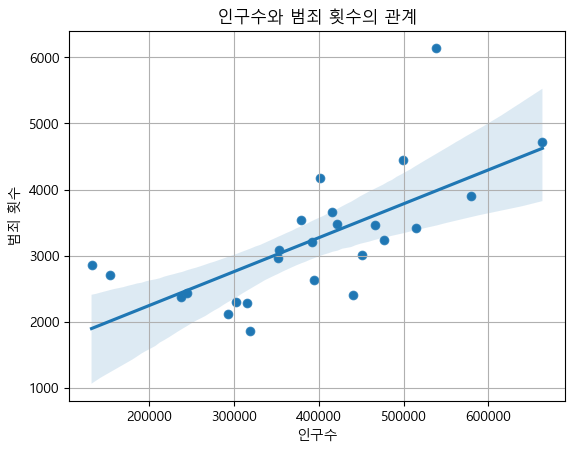

In [21]:
#인구에 따른 범죄횟수 추세선
#서울시 자치구별 인구수
data4_1 = data4[['2021. 12.1']]
data4_1 = data4_1.drop([0,1,2], axis = 0)
data4_1 = data4_1.reset_index(drop = True)
data4_1 = data4_1.astype(float)
data4_1.insert(0, '지역', data_area)

#서울시 자치구별 범죄발생 횟수
data1_1 = data1[['2021']]
data1_1 = data1_1.drop([0,1,2,3], axis = 0)
data1_1 = data1_1.reset_index(drop = True)
data1_1 = data1_1.astype(float)

data_population_criminal = pd.concat([data4_1,data1_1], axis = 1)

sns.scatterplot(x=data_population_criminal['2021. 12.1'], y=data_population_criminal['2021'])
sns.regplot(x=data_population_criminal['2021. 12.1'], y=data_population_criminal['2021'])
plt.title('인구수와 범죄 횟수의 관계')
plt.xlabel("인구수")
plt.ylabel("범죄 횟수")
plt.grid()
plt.show()

C:\Users\ppjj2\AppData\Local\Temp\ipykernel_35388\209027814.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2_1.dropna(inplace = True)


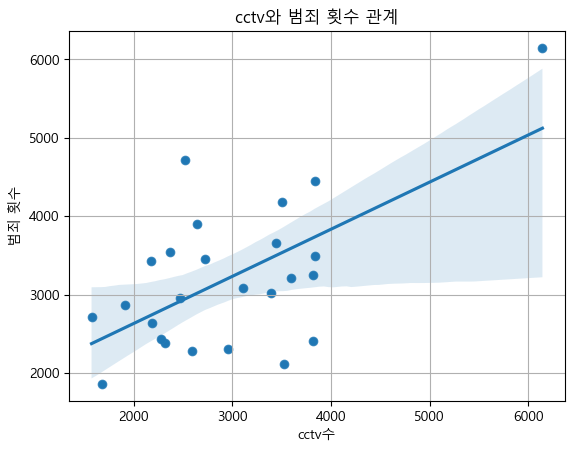

In [20]:
#cctv 개수에 따른 범죄횟수 추세선
#서울시 자치구별 cctv 수
data2_1 = data2[['2021년']]
data2_1.dropna(inplace = True)

data_cctv_criminal = pd.concat([data2_1,data1_1], axis = 1)

sns.scatterplot(x=data_cctv_criminal['2021년'], y=data_cctv_criminal['2021'])
sns.regplot(x=data_cctv_criminal['2021년'], y=data_cctv_criminal['2021'])
plt.title('cctv와 범죄 횟수 관계')
plt.xlabel("cctv수")
plt.ylabel("범죄 횟수")
plt.grid()
plt.show()